In [1]:
import os 
import torch as th
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
plt.rcParams["font.family"] = "Times New Roman"
plt.figure(dpi=800)
path1 = f'/home/221/123/result/inpainting/diff_t2_s/0'
path2 = '/home/221/123/result/inpainting/diff_t2_s_no_attack'
path3 = f'/home/221/123/result/inpainting/diff_t2_s/101'
addresult = lambda p: os.path.join(p, 'result')
path1 = addresult(path1)
path2 = addresult(path2)
path3 = addresult(path3)
tensor_i = 5
tensor_name = '{:0>5d}.pt'.format(tensor_i)

t0 = th.load(os.path.join(path1, tensor_name))['sample']
t0 = th.clamp((t0+1)/2, 0, 1)

original = th.load(os.path.join(path1, tensor_name))['x']
original = th.clamp((original+1)/2, 0, 1)

noattack = th.load(os.path.join(path2, tensor_name))['sample']
noattack = th.clamp((noattack+1)/2, 0, 1)

t101 = th.load(os.path.join(path3, tensor_name))['sample']
t101 = th.clamp((t101+1)/2, 0, 1)


/root/miniconda/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<Figure size 5120x3840 with 0 Axes>

In [3]:
def show_tensor_images(image_tensor, fs=10, name=None,p='/home/221/123/visulization'):
    image_tensor = image_tensor.detach().cpu()
    image_grid = make_grid(image_tensor, nrow=5)
    plt.figure(figsize=(fs, fs), dpi=1000)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if name is not None:
        plt.xticks([])  # 去掉x轴
        plt.yticks([])  # 去掉y轴
        plt.axis('off')  # 去掉坐标轴
        plt.savefig(os.path.join(p, f"{name}.png"), bbox_inches='tight')
    plt.show()

# show_tensor_images(th.cat([abs(t0 - original)*10, abs(t101 - original)*10]), name = 'vis')

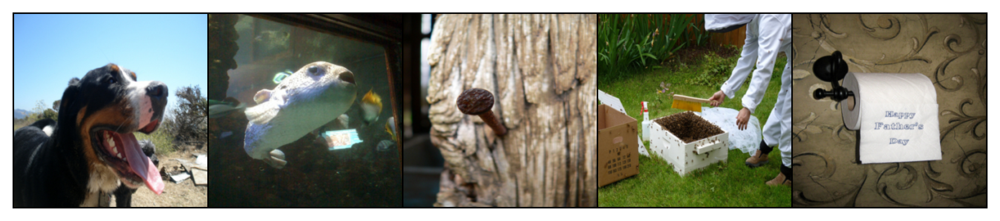

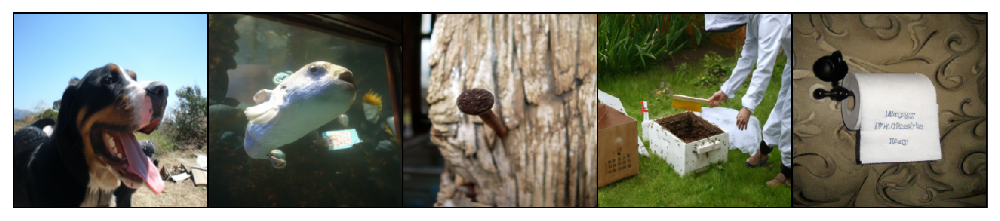

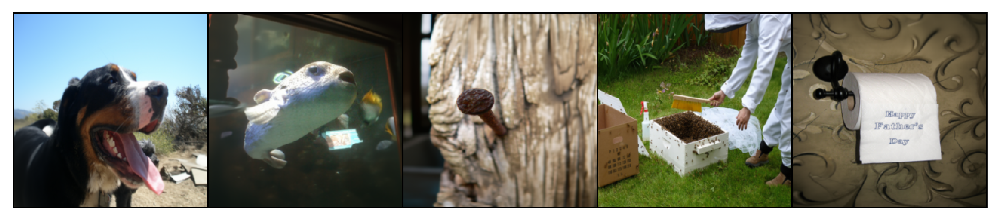

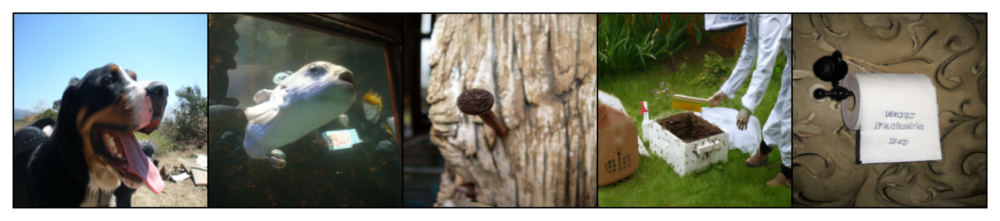

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


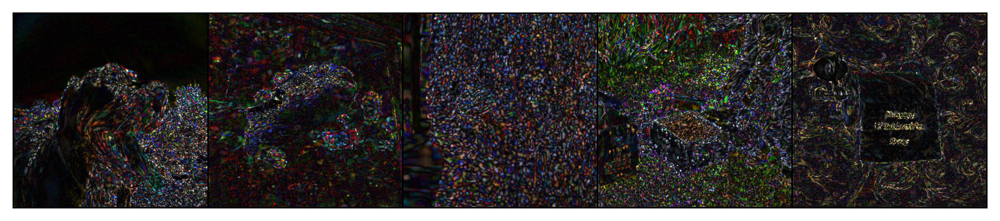

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


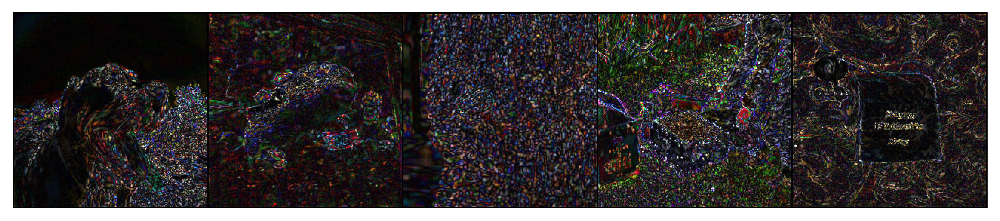

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


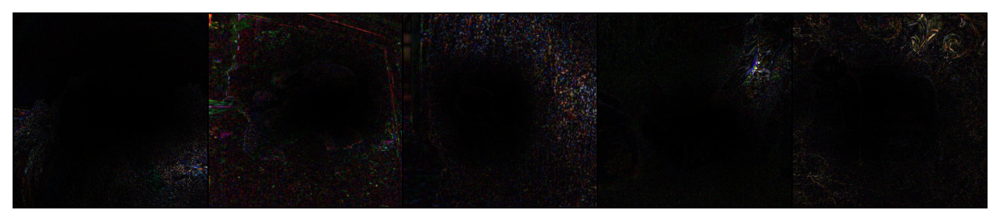

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


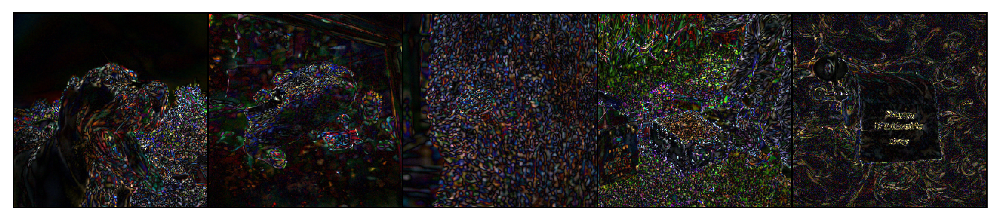

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


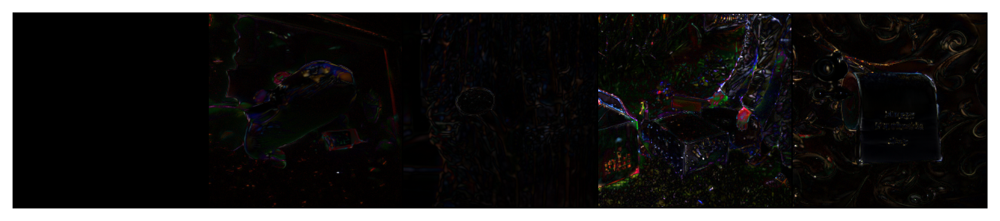

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


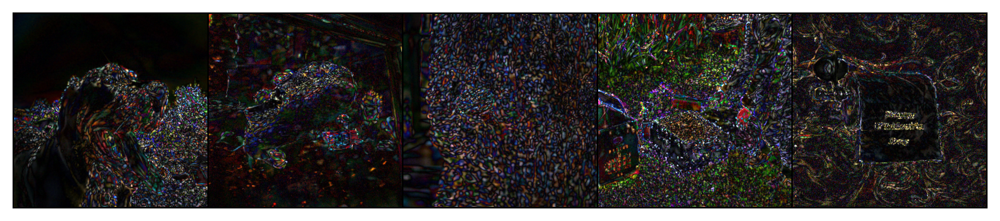

In [4]:
show_tensor_images(original, name='original images')
show_tensor_images(noattack, name='images without attacking')
show_tensor_images(t0, name='images with inpainting')
show_tensor_images(t101, name='images without inpainting')
show_tensor_images(abs(noattack-original)*5, name='delta in nature generated images') # 不攻击 纯自然生成的图片和原图有细节上的差别
show_tensor_images(abs(t101 - original)*5, name='delta in images without inpainting') # 攻击后 不使用原图引导和原图有细节上的差别
show_tensor_images(abs(t0 - original)*5, name='delta in images with inpainting')# 攻击且引导, 只在非主体区域和原图有细微差别 (攻击性目前弱)
show_tensor_images(abs(t0-noattack)*5, name='delta between with inpainting and no attack') # 攻击且和原图引导, 和不攻击有细节上的差别
show_tensor_images(abs(t101-noattack)*5, name='delta between without inpainting and no attack')  # 攻击但是不和原图引导, 由于随机种子一致, 结果其实只对非主体进行了攻击? 
show_tensor_images(abs(t0-t101)*5, name = 'delta between without inpainting and with inpainting') # 和原图引导能够比较大

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


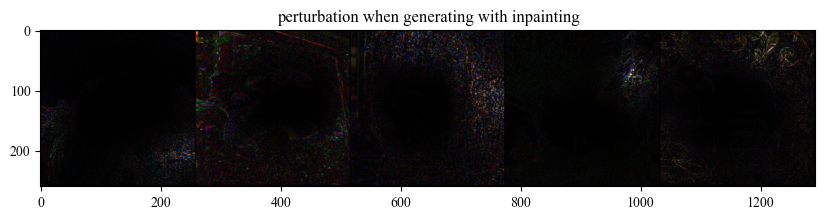

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


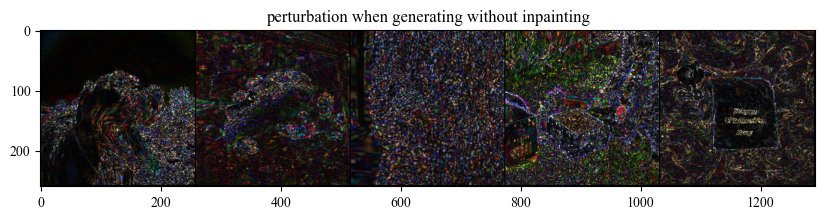

In [3]:
# def getimg(p, tensor_i = 5):
#     p = f'/home/221/123/result/inpainting/diff_t2_s/{p}'
#     p = os.path.join(p, 'result')
#     tensor_name = '{:0>5d}.pt'.format(tensor_i)
#     t0 = th.load(os.path.join(p, tensor_name))['sample']
#     t0 = th.clamp((t0+1)/2, 0, 1)
#     return t0
# getdiff = lambda img, o: abs(img - o)*5

ppp = '/home/221/123/visulization/diff_t'
# show_tensor_images(getdiff(getimg(0), original), name='perturbation when generating with inpainting', p=ppp)
# show_tensor_images(getdiff(getimg(20), original), name='delta between with inpainting(80) and original', p=ppp)
# show_tensor_images(getdiff(getimg(40), original), name='delta between with inpainting(60) and original', p=ppp)
# show_tensor_images(getdiff(getimg(60), original), name='delta between with inpainting(40) and original', p=ppp)
# show_tensor_images(getdiff(getimg(80), original), name='delta between with inpainting(20) and original', p=ppp)
# show_tensor_images(getdiff(getimg(92), original), name='delta between with inpainting(8) and original', p=ppp)
# show_tensor_images(getdiff(getimg(101), original), name='perturbation when generating without inpainting', p=ppp)